# Grid search sanity check
Stefan/Yuzhao Heng
Since Sun. Dec. 5th, 2021

As humans, from the HSR's laser readings, we have an idea of where KUKA is.
Intuitively, the actual pose of KUKA's shape, relative to HSR's laser scan,
    should have some notion of fitness/closeness.


As a sanity check, we systematically search through possible pose configurations via grid search.
Taking inspiration from ICP, we define loss, given a target and source point clouds,
    as the distance between matched points


## Setup



In [9]:
import os

from icecream import ic

from scripts.data_path import *
from scripts.util import *
from scripts.robo_pose_estimator import *


rcParams["figure.dpi"] = 300
rcParams['font.size'] = 6

pts_hsr = eg_hsr_scan()
pcr_kuka = get_kuka_pointcloud()

tsf_ideal = tsl_n_angle2tsf(config('heuristics.pose_guess.actual_pose'))

d_cls_res = config('heuristics.cluster_results.good')
lbs = d_cls_res['labels']
d_clusters = d_cls_res['clusters']
d_clusters = {int(k): v for k, v in d_clusters.items()}



## Check implementation correct



2021-12-06 00:16:38| Grid-searching for pose estimates on ... 
    target of [963] points, and 
    source of [240] points ... 
    x range (-4, 9), at precision 1 => 14 candidates and 
    y range (-3, 11), at precision 1 => 15 candidates and 
    angle range (0, 1), at precision 0.5 => 2 candidates, 
    for a combined [420] candidate setups... 
2021-12-06 00:16:39| ... completed


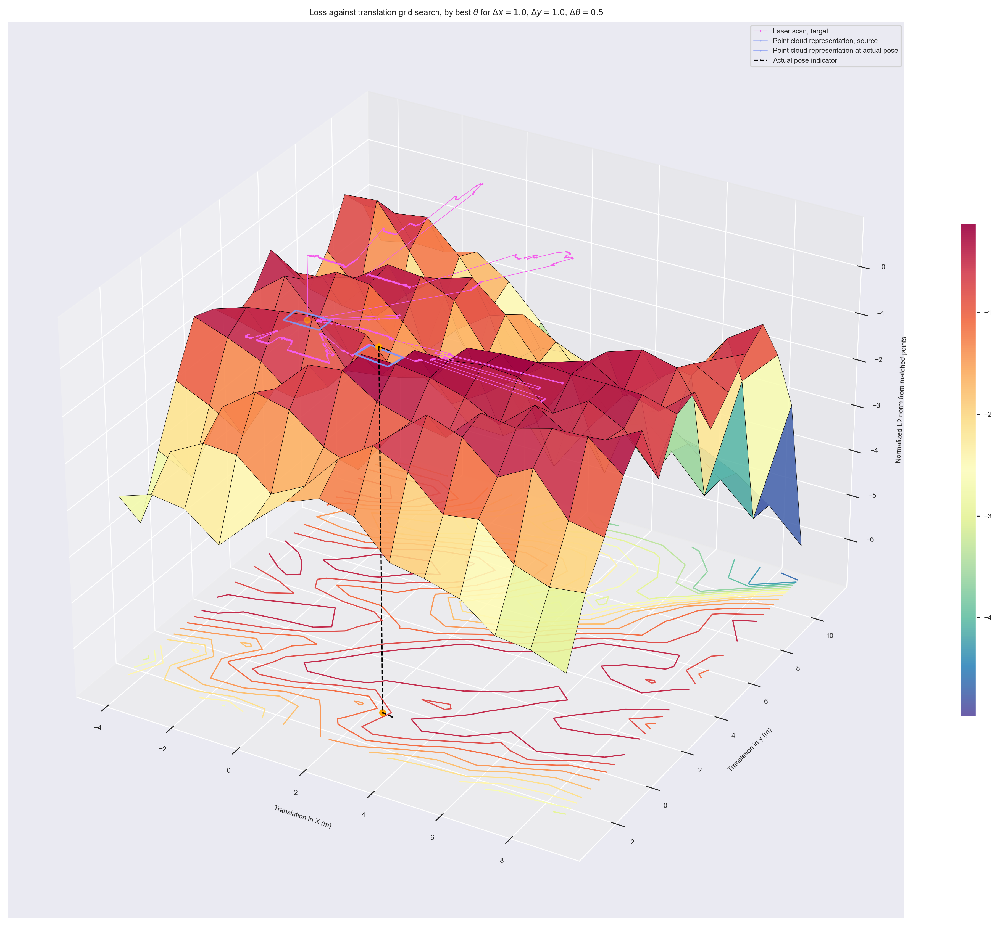

In [3]:
ret = Search.grid_search(
    (pcr_kuka, pts_hsr),
    grid=dict(precision=dict(tsl=1, angle=1/2), range=dict(angle=(0, 1)))
)
plot_grid_search(
    pcr_kuka, pts_hsr, *ret,
    inverse_loss=True,
    tsf_ideal=tsf_ideal,
    zlabel='Normalized L2 norm from matched points',
    interp=False,
)


## Run
A configuration that includes the actual KUKA pose observed
Many translations seem to have a low loss => Doesn't align with our intuition



2021-12-06 00:17:26| Grid-searching for pose estimates on ... 
    target of [963] points, and 
    source of [240] points ... 
    x range (-4, 9), at precision 0.25 => 53 candidates and 
    y range (-3, 11), at precision 0.25 => 57 candidates and 
    angle range (0, 1), at precision 0.05 => 20 candidates, 
    for a combined [60420] candidate setups... 
2021-12-06 00:18:48| ... completed


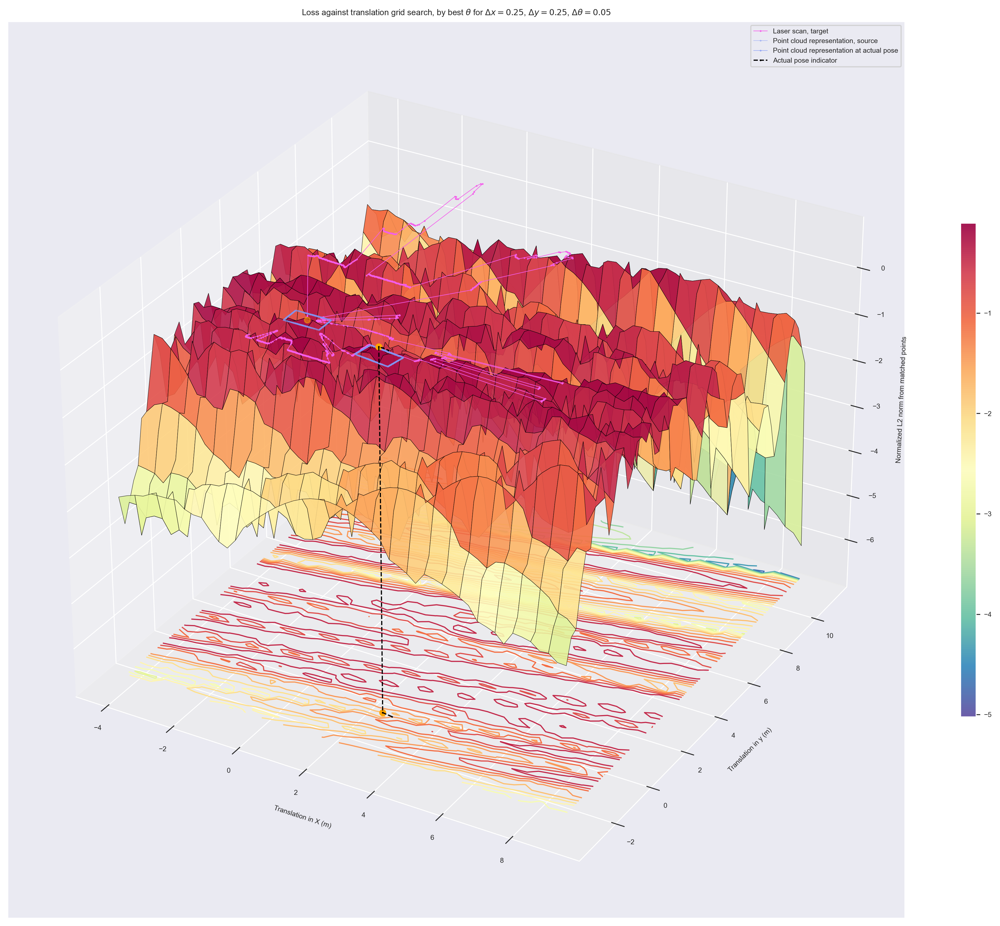

In [4]:
ret = Search.grid_search(
    (pcr_kuka, pts_hsr),
    grid=dict(precision=dict(tsl=0.25, angle=1/20), range=dict(angle=(0, 1)))
)
plot_grid_search(
    pcr_kuka, pts_hsr, *ret,
    inverse_loss=True,
    tsf_ideal=tsf_ideal,
    zlabel='Normalized L2 norm from matched points',
    interp=False,
)


## Cluster first?
Given a good clustering result, and reversing the source and target clouds, and with good initial guess,
    ICP can get a good pose estimate
So we similarly try restricting loss by each cluster

Picked a cluster result known to contain a cluster indicative of the actual KUKA pose


At least the actual pose has a pretty good loss



2021-12-06 00:19:48| Grid-searching for pose estimates on ... 
    target of [240] points, and 
    source of [963] points ... 
    x range (-5, 5), at precision 0.25 => 41 candidates and 
    y range (-5, 5), at precision 0.25 => 41 candidates and 
    angle range (0, 1), at precision 0.05 => 20 candidates, 
    for a combined [33620] candidate setups... 
2021-12-06 00:19:48| Getting errors for cluster #1... 
2021-12-06 00:20:24| Getting errors for cluster #2... 
2021-12-06 00:20:38| Getting errors for cluster #3... 
2021-12-06 00:20:53| Getting errors for cluster #4... 
2021-12-06 00:21:22| Getting errors for cluster #5... 
2021-12-06 00:22:06| Getting errors for cluster #6... 
2021-12-06 00:22:24| Getting errors for cluster #7... 
2021-12-06 00:22:44| Getting errors for cluster #8... 
2021-12-06 00:23:01| Getting errors for cluster #9... 
2021-12-06 00:23:21| Getting errors for cluster #10... 
2021-12-06 00:23:51| Getting errors for cluster #11... 
2021-12-06 00:24:04| Getting error

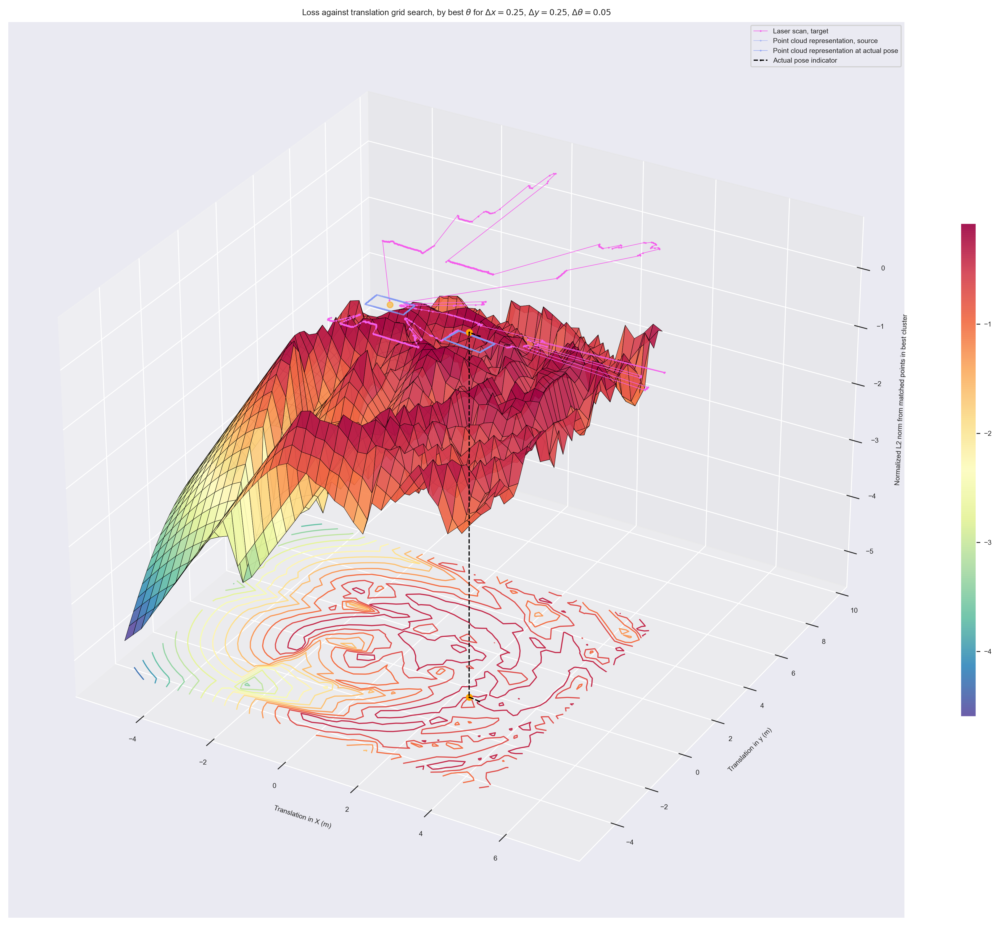

In [5]:
# lbs = Cluster.cluster(pts_hsr, approach='hierarchical', distance_threshold=1)

ret = Search.grid_search(
    (pcr_kuka, pts_hsr),
    reverse=True,
    # save=True,
    grid=dict(precision=dict(tsl=0.25, angle=1/20), range=dict(x=(-5, 5), y=(-5, 5), angle=(0, 1))),
    err_kwargs=dict(labels=lbs, bias=True, n=2)
)
plot_grid_search(
    pts_hsr, pcr_kuka, *ret,
    inverse_loss=True,
    inverse_pts=True,
    labels=lbs,
    interp=False,
    save=True,
    tsf_ideal=tsf_ideal,
    zlabel='Normalized L2 norm from matched points in best cluster'
)



## Why the outliers?
Still, there are many translations that produce a good loss, investigate why



ic| opn: array([-1.5,  0.5,  0.1])
    label: 11
    errs_[idx]: 0.009026701256819395


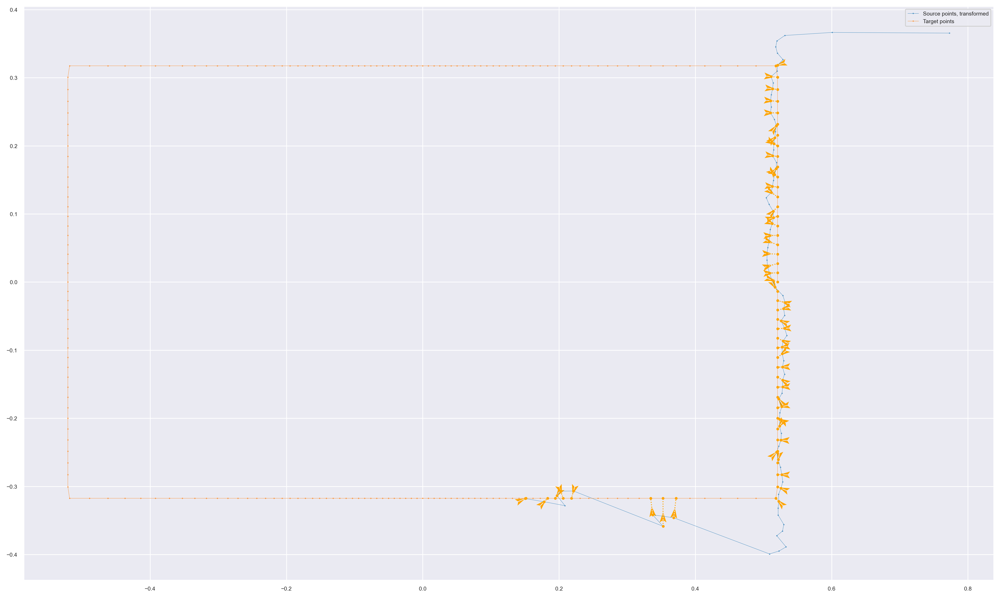

ic| error: 0.009026701256819395
ic| opn: array([-2.  , -4.5 ,  0.05])
    label: 13
    errs_[idx]: 0.012093064584700936


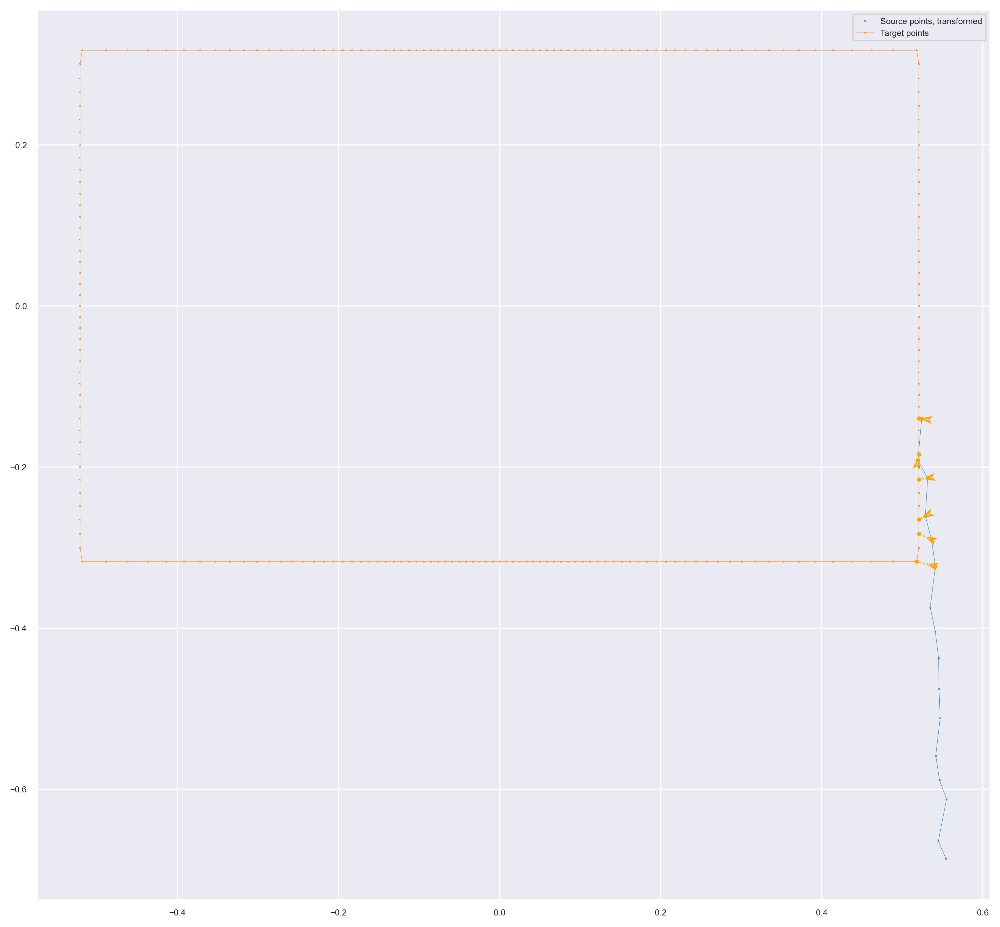

ic| error: 0.012093064584700936
ic| opn: array([-0.5 , -2.75,  0.05])
    label: 9
    errs_[idx]: 0.012209917734188044


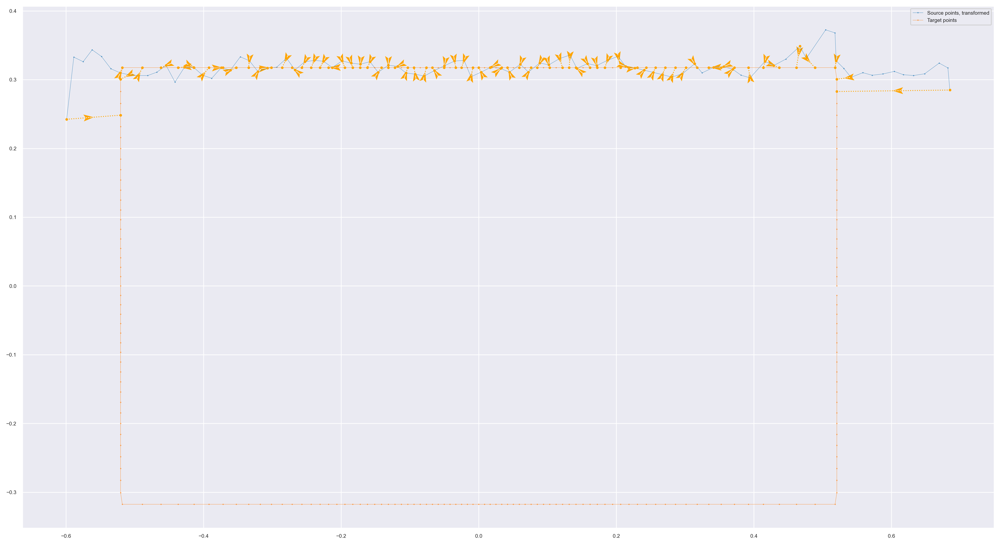

ic| error: 0.012209917734188044
ic| opn: array([-0.75, -2.75,  0.05])
    label: 9
    errs_[idx]: 0.01513859620735223


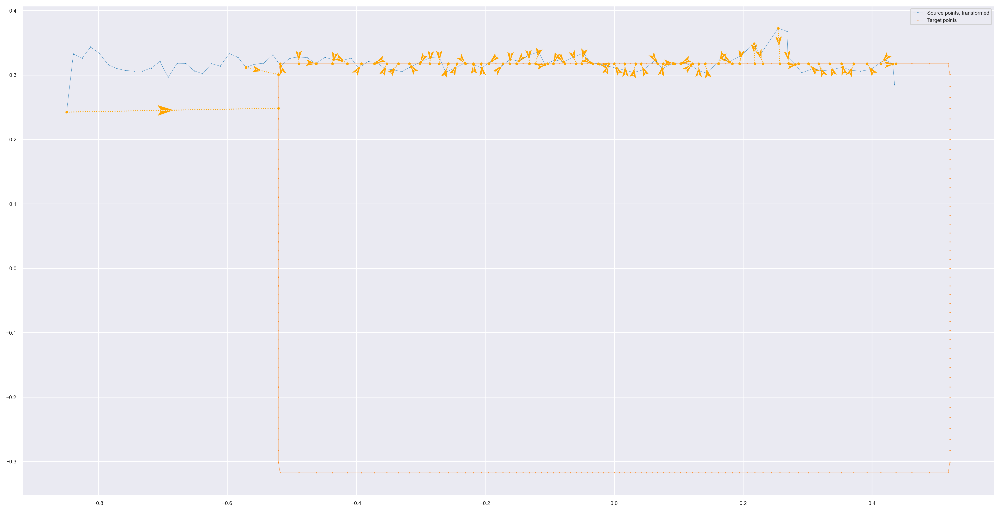

ic| error: 0.01513859620735223
ic| opn: array([-0.25, -2.75,  0.05])
    label: 9
    errs_[idx]: 0.01608753629081438


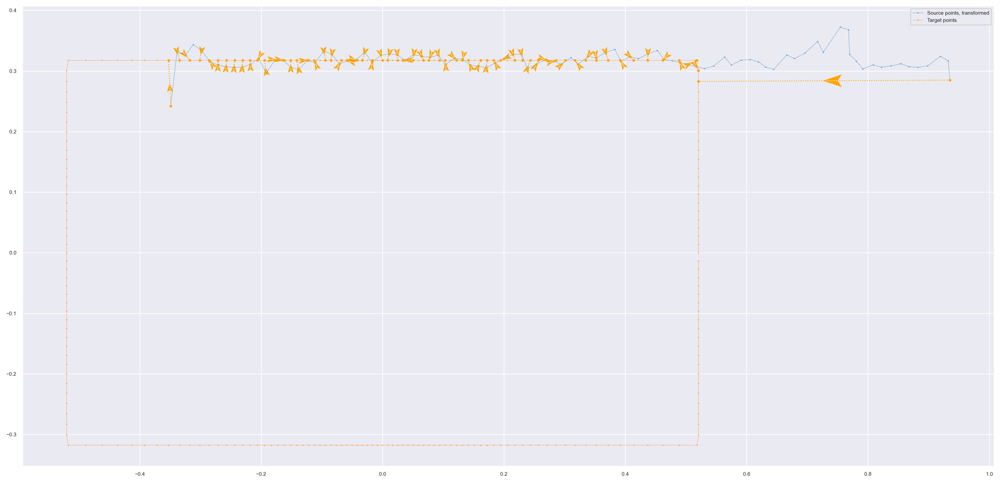

ic| error: 0.01608753629081438
ic| opn: array([ 2.5 , -6.  ,  0.75])
    label: 14
    errs_[idx]: 0.016634504481959113


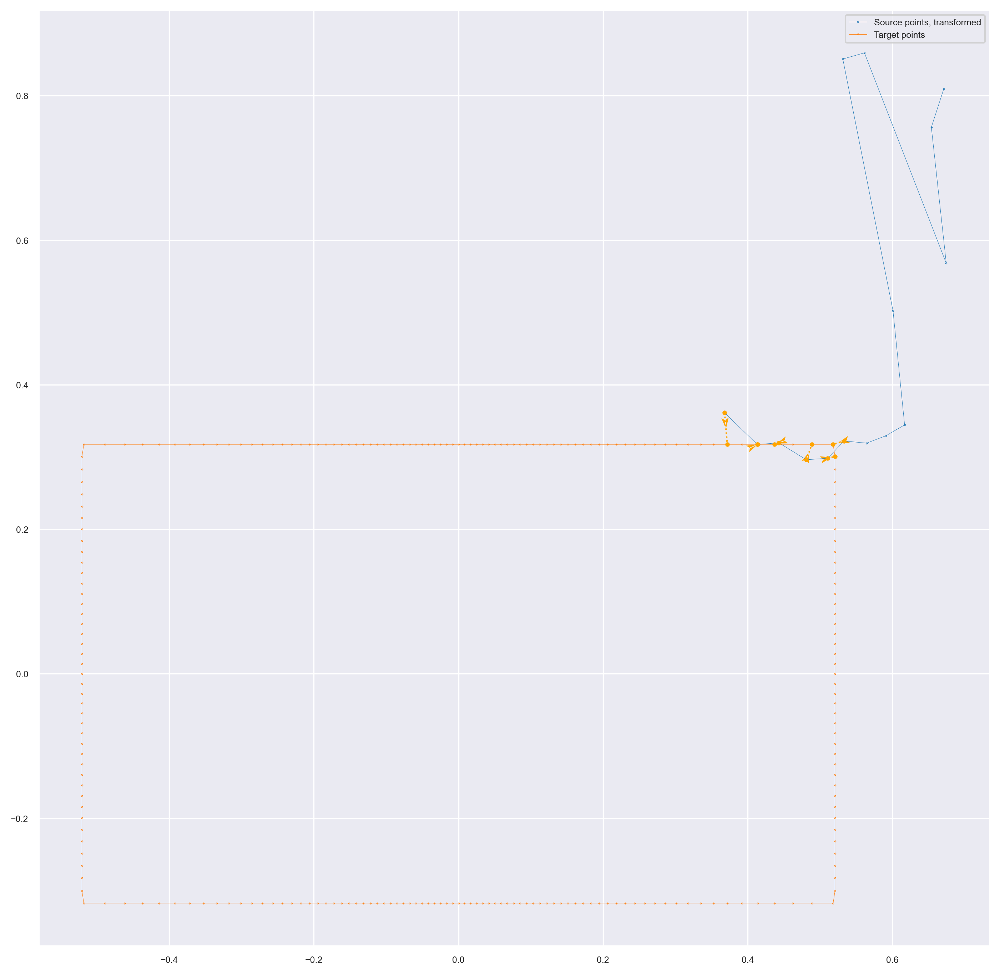

ic| error: 0.016634504481959113
ic| opn: array([-0.75,  2.  ,  0.05])
    label: 12
    errs_[idx]: 0.01717002095003746


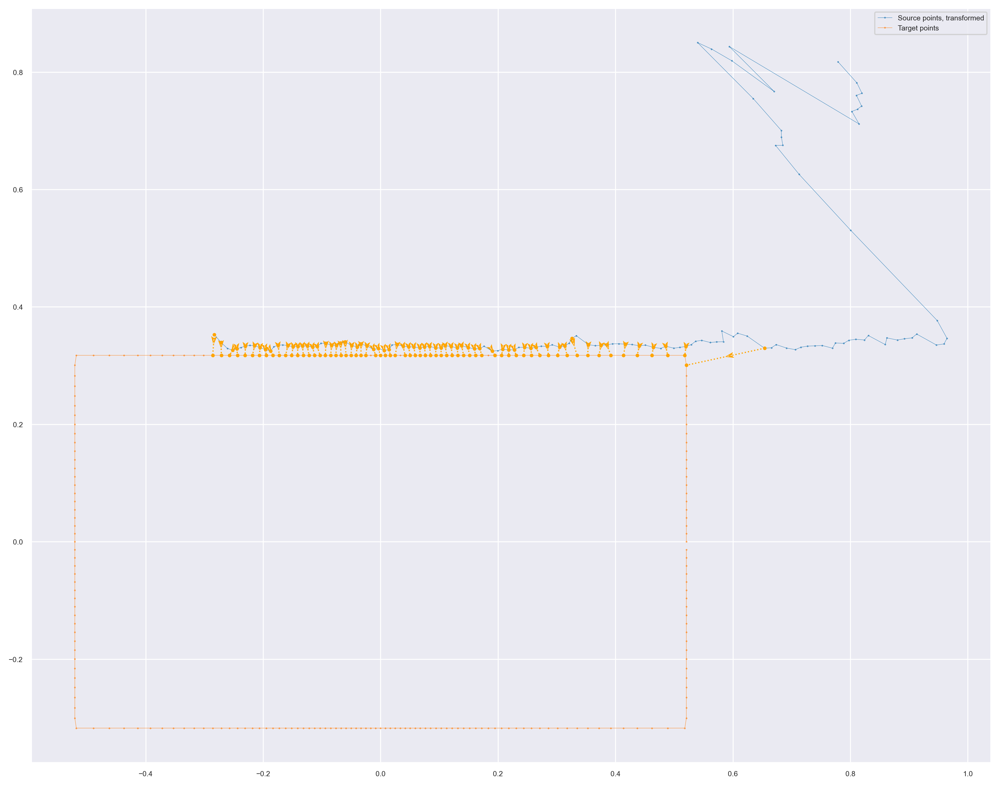

ic| error: 0.01717002095003746
ic| opn: array([-0.5 , -1.75,  1.  ])
    label: 7
    errs_[idx]: 0.01731932017111857


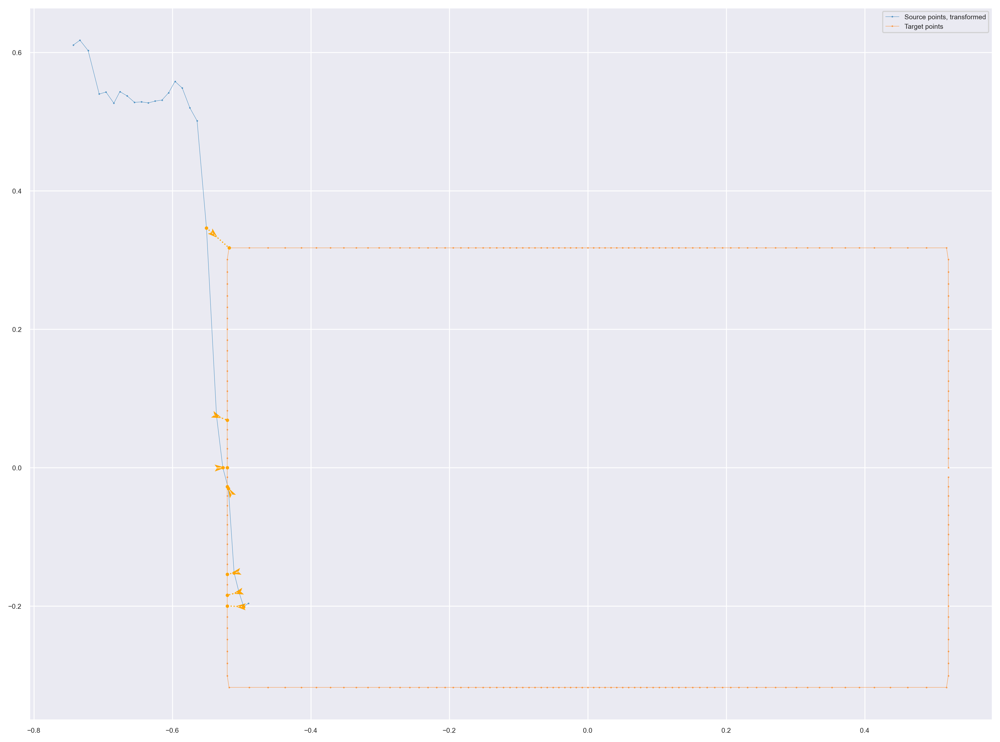

ic| error: 0.01731932017111857
ic| opn: array([-2.5 ,  0.5 ,  0.05])
    label: 11
    errs_[idx]: 0.01774790184199791


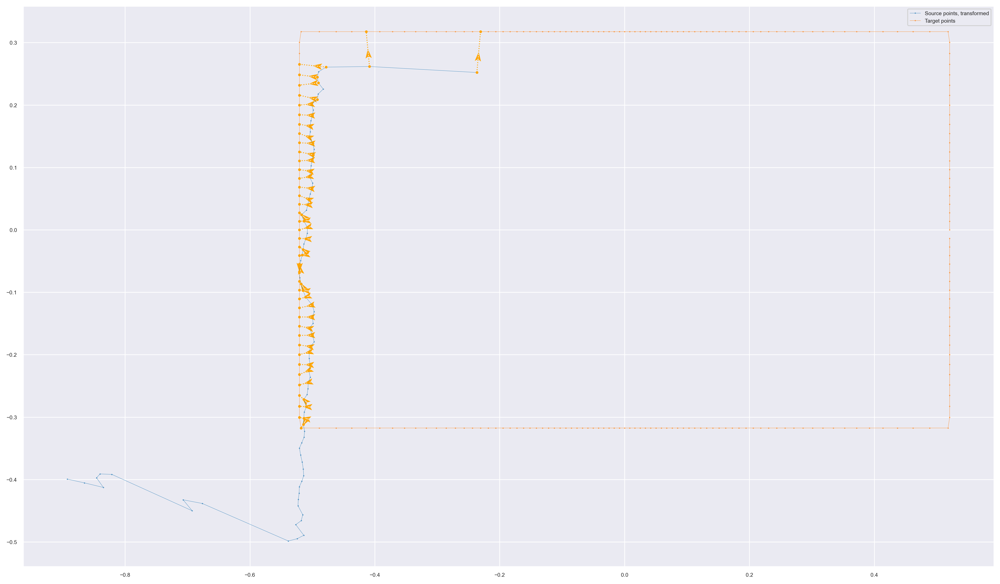

ic| error: 0.01774790184199791
ic| opn: array([ 1.5 , -2.75,  0.1 ])
    label: 3
    errs_[idx]: 0.017925813107203124


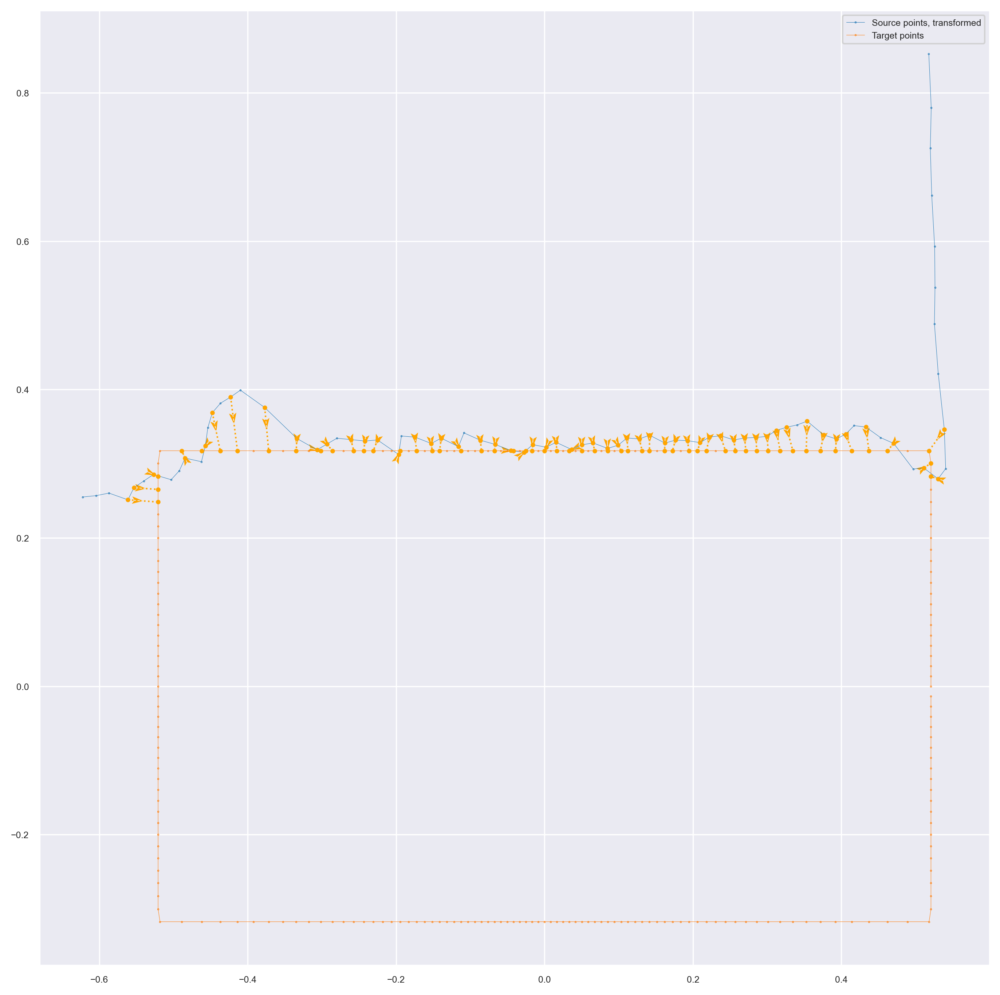

ic| error: 0.017925813107203124
ic| opn: array([-2.  , -4.25,  0.05])
    label: 13
    errs_[idx]: 0.01805166069417232


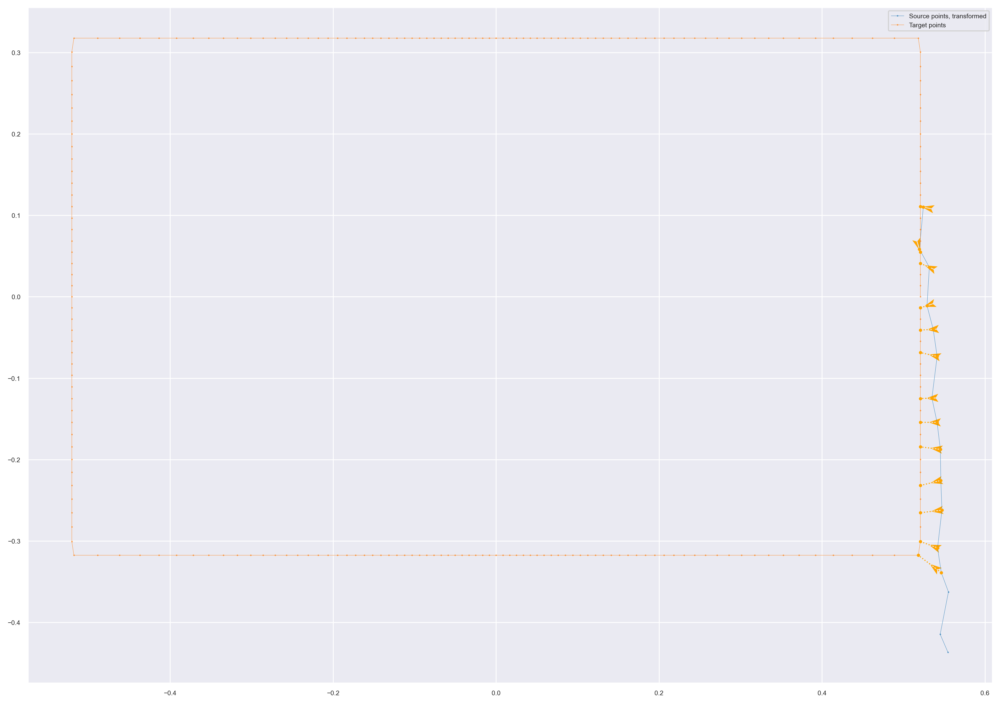

ic| error: 0.01805166069417232
ic| opn: array([-2.5 ,  0.75,  0.05])
    label: 11
    errs_[idx]: 0.018591424013024944


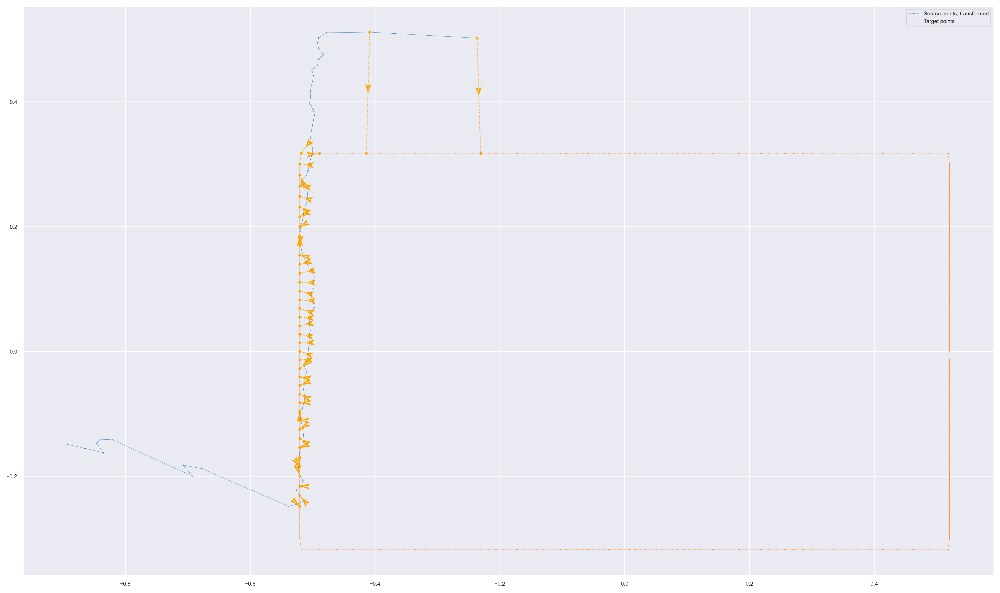

ic| error: 0.018591424013024944
ic| opn: array([-0.5 ,  2.  ,  0.05])
    label: 12
    errs_[idx]: 0.01884447009379919


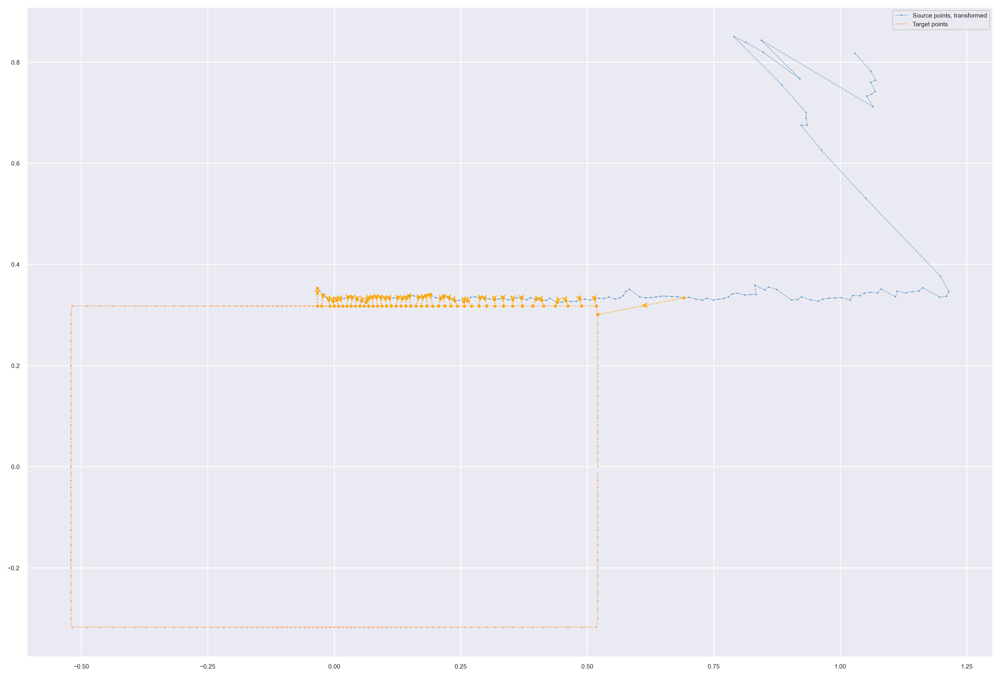

ic| error: 0.01884447009379919
ic| opn: array([-1.75, -2.25,  0.35])
    label: 7
    errs_[idx]: 0.019567355718837665


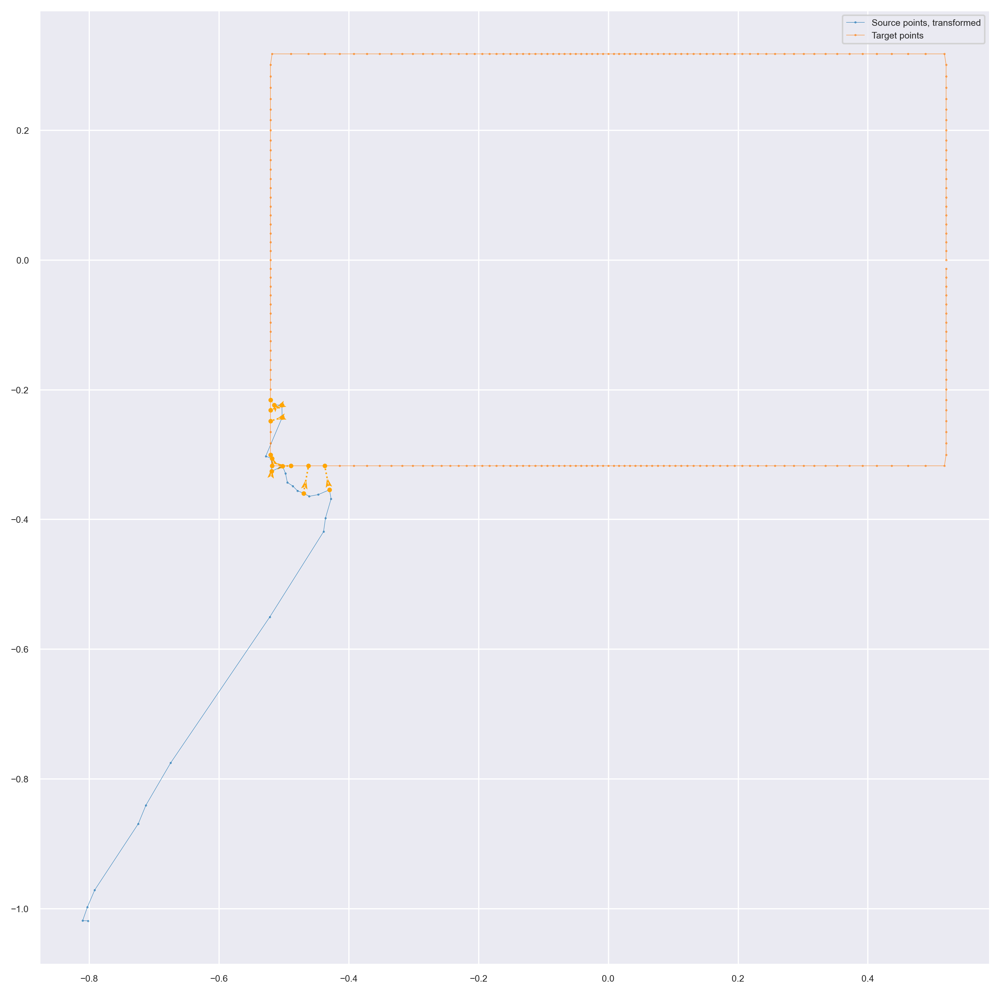

ic| error: 0.019567355718837665
ic| opn: array([-0.75, -3.5 ,  0.2 ])
    label: 9
    errs_[idx]: 0.019833962985015764


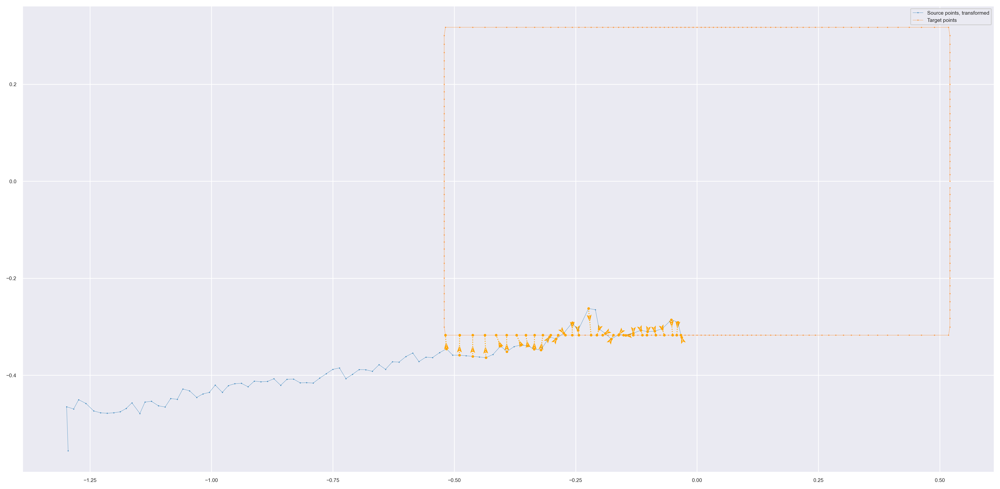

ic| error: 0.019833962985015764
ic| opn: array([-2.5 ,  0.25,  0.05])
    label: 11
    errs_[idx]: 0.019838490734116688


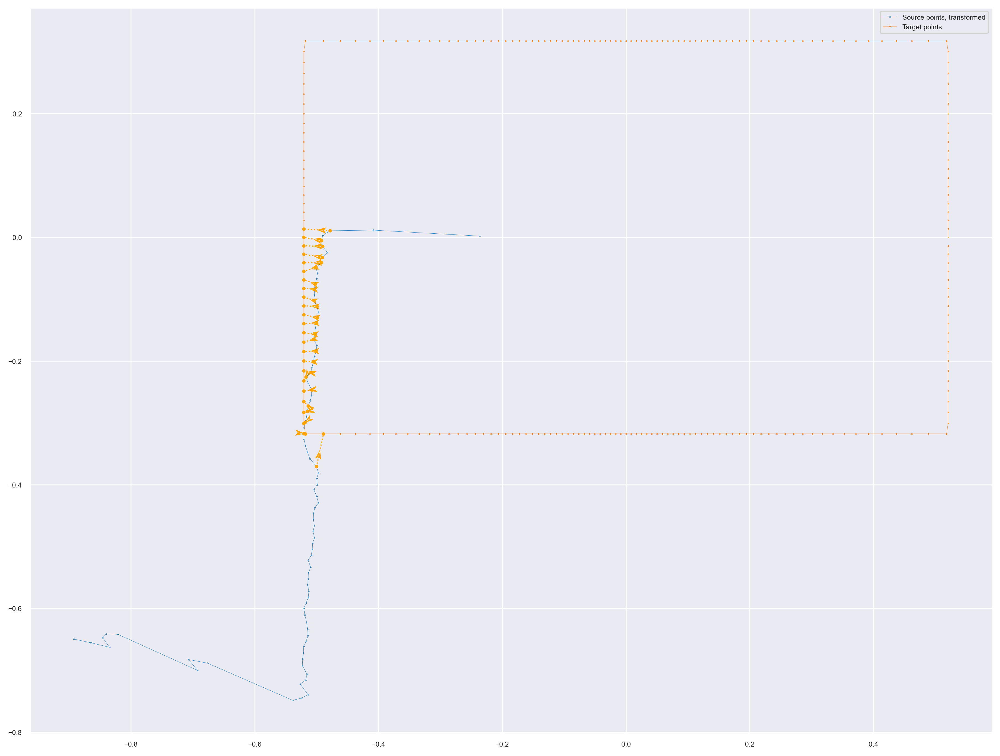

ic| error: 0.019838490734116688
ic| opn: array([ 0.  , -2.75,  0.1 ])
    label: 9
    errs_[idx]: 0.021410692982379353


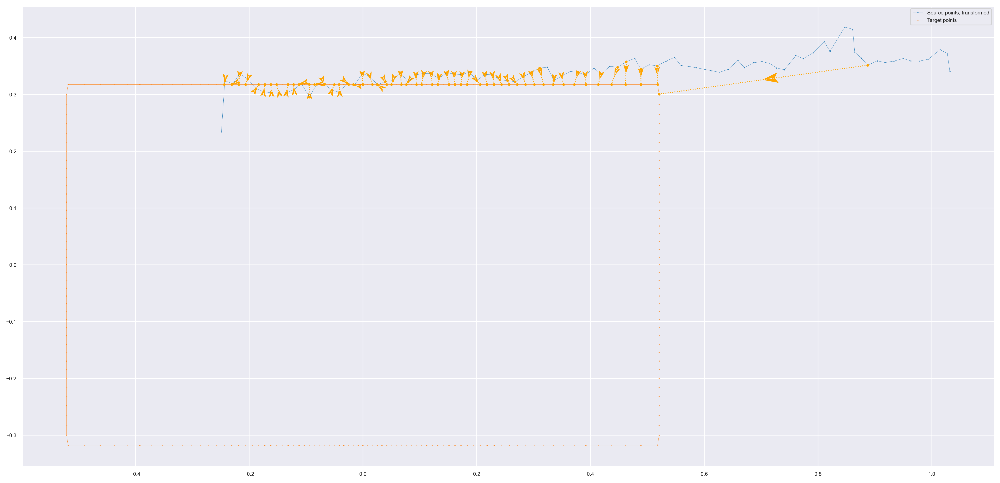

ic| error: 0.021410692982379353
ic| opn: array([-1.25, -2.5 ,  0.6 ])
    label: 7
    errs_[idx]: 0.021478789281310095


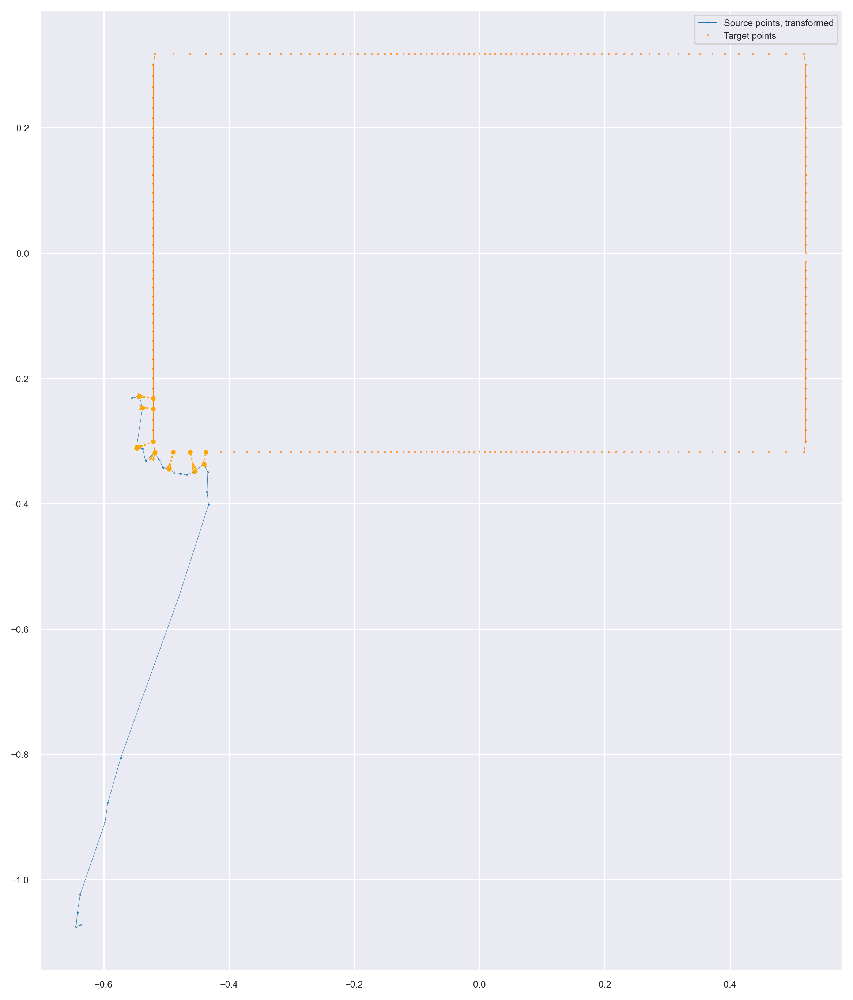

ic| error: 0.021478789281310095
ic| opn: array([ 0.25, -2.75,  0.1 ])
    label: 9
    errs_[idx]: 0.02160779259611115


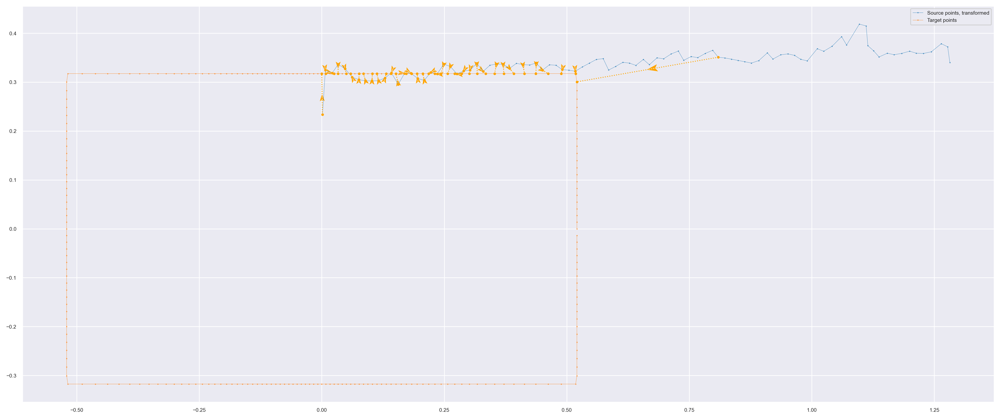

ic| error: 0.02160779259611115
ic| opn: array([-2.25, -1.  ,  0.2 ])
    label: 6
    errs_[idx]: 0.02198409209339737


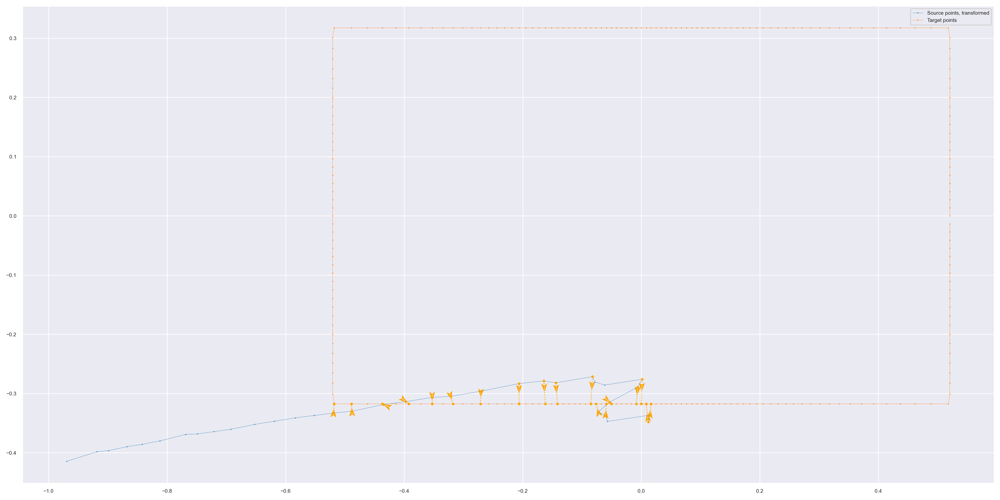

ic| error: 0.02198409209339737


In [16]:
fnm = os.path.join(
    PATH_BASE, DIR_PROJ,
    # 'gird-search, [(-5, 5), (-5, 5), 0.25], [(0, 1), 0.05], 2021-12-06 22:54:01.pickle'
    # 'gird-search, [(-6, 6), (-6, 6), 0.25], [(0, 1), 0.05], 2021-12-07 00:07:43.pickle',
    'gird-search, [(-13, 13), (-13, 13), 0.25], [(0, 1), 0.05], 2021-12-07 00:32:29.pickle'
)


with open(fnm, 'rb') as handle:
    d = pickle.load(handle)
    opns_x = d['options_x']
    opns_y = d['options_y']
    opns_ang = d['options_angle']
    errs = d['errors']
    label_idxs = d['label_indices']
    clusters = [pts_hsr[np.where(lbs == lb)] for lb in label_idxs]

    opns = cartesian([opns_x, opns_y, opns_ang])
    idxs_sort = np.argsort(errs.min(axis=-1))
    opns = opns[idxs_sort]
    errs = errs[idxs_sort]
    n = 20

    for opn, errs_ in zip(opns[:n], errs[:n]):
        idx = np.argmin(errs_)
        label = label_idxs[idx]
        ic(opn, label, errs_[idx])

        error = Loss(pcr_kuka).pose_error(d_clusters[label], opn, labels=None, plot=True)
        ic(error)

